In [ ]:
import pandas as pd

In [ ]:
pd.set_option('display.max_colwidth', None)
# pd.set_option('display.max_rows', None)

In [ ]:
df = pd.read_csv("bbc-text.csv")
# df

Data preprocessing

In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2225 entries, 0 to 2224
Data columns (total 2 columns):
 #   Column    Non-Null Count  Dtype 
---  ------    --------------  ----- 
 0   category  2225 non-null   object
 1   text      2225 non-null   object
dtypes: object(2)
memory usage: 34.9+ KB


In [ ]:
for col in df.columns:
    print(f"{col}: {df[col].nunique()}")

category: 5
text: 2126


In [ ]:
df['category'].value_counts()

,count
category,
sport,511
business,510
politics,417
tech,401
entertainment,386


we have dataset of 2225 news articles and 5 categories

EDA

In [ ]:
# check sentence length and plot distribution using plotly

import plotly.express as px

# Calculate sentence lengths
df['sentence_length'] = df['text'].apply(lambda x: len(x.split()))

# Create the histogram
fig = px.histogram(df, x="sentence_length", nbins=50, title="Distribution of Sentence Lengths")
fig.show()

In [ ]:
# based on category plot scater plot of the sentence length

import pandas as pd
import plotly.express as px

df = pd.read_csv("bbc-text.csv")

# Calculate sentence lengths
df['sentence_length'] = df['text'].apply(lambda x: len(x.split()))

# Create the category plot (scatter plot)
fig = px.scatter(df, x="category", y="sentence_length",
                 title="Sentence Length by Category",
                 color="category", # Color points by category
                 hover_data=["text"]) # Show text on hover

fig.show()

In [ ]:
# perform box plot for each category different color use plotly

import plotly.express as px

# Assuming 'df' is your DataFrame and it has columns 'category' and 'sentence_length'

fig = px.box(df, x="category", y="sentence_length", color="category", title="Sentence Length Distribution by Category")
fig.show()

There are so many outlier values for each category.

#### Before and After removing outlier

In [ ]:
# histogram distribution of each category  before and after remove outlier one histogram for each category each row plot 5 histogram categories

import pandas as pd
import plotly.express as px
import plotly.graph_objects as go
from plotly.subplots import make_subplots

def plot_histograms(df, categories):
    num_categories = len(categories)
    rows = (num_categories + 4) // 5  # Calculate the number of rows needed
    cols = min(5, num_categories)

    fig = make_subplots(rows=rows, cols=cols, subplot_titles=categories)

    for i, category in enumerate(categories):
        row = (i // cols) + 1
        col = (i % cols) + 1

        # Calculate Q1, Q3, and IQR
        Q1 = df[df['category'] == category]['sentence_length'].quantile(0.25)
        Q3 = df[df['category'] == category]['sentence_length'].quantile(0.75)
        IQR = Q3 - Q1

        # Define bounds for outlier removal
        lower_bound = Q1 - 1.5 * IQR
        upper_bound = Q3 + 1.5 * IQR

        # Filter out outliers
        df_filtered = df[(df['category'] == category) &
                         (df['sentence_length'] >= lower_bound) &
                         (df['sentence_length'] <= upper_bound)]

        fig.add_trace(go.Histogram(x=df[df['category'] == category]['sentence_length'],
                                   name=f'{category} (Before)',
                                   marker_color='blue',
                                   opacity=0.6),
                     row=row, col=col)

        fig.add_trace(go.Histogram(x=df_filtered['sentence_length'],
                                   name=f'{category} (After)',
                                   marker_color='red',
                                   opacity=0.6),
                     row=row, col=col)

    fig.update_layout(height=rows * 300, width=cols * 300, title_text="Distribution of Sentence Lengths by Category (Before & After Outlier Removal)")
    fig.show()

# Sentence length
df['sentence_length'] = df['text'].apply(lambda x: len(x.split()))

unique_categories = df['category'].unique()
plot_histograms(df, unique_categories)

In [ ]:
import pandas as pd
import plotly.graph_objects as go
from plotly.subplots import make_subplots

def plot_histograms(df, categories):
    num_categories = len(categories)
    rows = num_categories  # One row per category
    cols = 1  # Single column layout

    fig = make_subplots(rows=rows, cols=cols, subplot_titles=categories)

    for i, category in enumerate(categories):
        row = i + 1  # Row index starts at 1

        # Calculate Q1, Q3, and IQR
        Q1 = df[df['category'] == category]['sentence_length'].quantile(0.25)
        Q3 = df[df['category'] == category]['sentence_length'].quantile(0.75)
        IQR = Q3 - Q1

        # Define bounds for outlier removal
        lower_bound = Q1 - 1.5 * IQR
        upper_bound = Q3 + 1.5 * IQR

        # Filter out outliers
        df_filtered = df[(df['category'] == category) &
                         (df['sentence_length'] >= lower_bound) &
                         (df['sentence_length'] <= upper_bound)]

        # Add "before outlier removal" histogram
        fig.add_trace(go.Histogram(x=df[df['category'] == category]['sentence_length'],
                                   name=f'{category} (Before)',
                                   marker_color='blue',
                                   opacity=0.6),
                      row=row, col=1)

        # Add "after outlier removal" histogram
        fig.add_trace(go.Histogram(x=df_filtered['sentence_length'],
                                   name=f'{category} (After)',
                                   marker_color='red',
                                   opacity=0.6),
                      row=row, col=1)

    fig.update_layout(height=rows * 300, width=1000,
                      title_text="Distribution of Sentence Lengths by Category (Before & After Outlier Removal)",
                      showlegend=True)
    fig.show()

# Assume df is your DataFrame and already contains a 'text' column and a 'category' column
df['sentence_length'] = df['text'].apply(lambda x: len(x.split()))
unique_categories = df['category'].unique()

# Call the function
plot_histograms(df, unique_categories)


show the data where there are outlier length

In [ ]:
import pandas as pd
import plotly.express as px
import plotly.graph_objects as go
from plotly.subplots import make_subplots


def identify_outliers(df, categories):
    outlier_data = []
    for category in categories:
        # Calculate Q1, Q3, and IQR
        Q1 = df[df['category'] == category]['sentence_length'].quantile(0.25)
        Q3 = df[df['category'] == category]['sentence_length'].quantile(0.75)
        IQR = Q3 - Q1

        # Define bounds for outlier detection
        lower_bound = Q1 - 1.5 * IQR
        upper_bound = Q3 + 1.5 * IQR

        # Identify outliers
        outliers = df[(df['category'] == category) & (
            (df['sentence_length'] < lower_bound) | (df['sentence_length'] > upper_bound))]

        outlier_data.extend(outliers.to_dict(orient='records'))

    return outlier_data

outliers = identify_outliers(df, unique_categories)

# Convert the list of dictionaries to a DataFrame
outliers_df = pd.DataFrame(outliers)

# Display or further process the outlier data
outliers_df

category  \
0       tech   
1       tech   
2       tech   
3       tech   
4   business   
..       ...   
80  politics   
81  politics   
82  politics   
83  politics   
84  politics   

                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                   

In [ ]:
outliers_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 85 entries, 0 to 84
Data columns (total 3 columns):
 #   Column           Non-Null Count  Dtype 
---  ------           --------------  ----- 
 0   category         85 non-null     object
 1   text             85 non-null     object
 2   sentence_length  85 non-null     int64 
dtypes: int64(1), object(2)
memory usage: 2.1+ KB


we have 2225 news so let's drop this 85 news articles

Distribution of data after remove outlier

In [ ]:
import pandas as pd
import plotly.express as px
import plotly.graph_objects as go
from plotly.subplots import make_subplots

def plot_filtered_histograms(df, categories):
    """
    Plots histograms for each category after removing outliers,
    with gridlines and different colors. Saves filtered data to a DataFrame.
    """
    num_categories = len(categories)
    rows = (num_categories + 4) // 5
    cols = min(5, num_categories)
    fig = make_subplots(rows=rows, cols=cols, subplot_titles=categories)

    filtered_data = []  # List to store filtered data for each category

    for i, category in enumerate(categories):
        row = (i // cols) + 1
        col = (i % cols) + 1

        Q1 = df[df['category'] == category]['sentence_length'].quantile(0.25)
        Q3 = df[df['category'] == category]['sentence_length'].quantile(0.75)
        IQR = Q3 - Q1
        lower_bound = Q1 - 1.5 * IQR
        upper_bound = Q3 + 1.5 * IQR

        df_filtered = df[(df['category'] == category) &
                         (df['sentence_length'] >= lower_bound) &
                         (df['sentence_length'] <= upper_bound)]

        filtered_data.extend(df_filtered.to_dict(orient='records'))

        fig.add_trace(go.Histogram(x=df_filtered['sentence_length'],
                                   name=category,
                                   marker_color=px.colors.qualitative.Plotly[i % 10], # Different colors
                                   opacity=0.7),
                      row=row, col=col)

        fig.update_xaxes(showgrid=True, gridwidth=0.5, gridcolor='LightGray', row=row, col=col)
        fig.update_yaxes(showgrid=True, gridwidth=0.5, gridcolor='LightGray', row=row, col=col)

    fig.update_layout(height=rows * 400, width=cols * 350, title_text="Distribution of Sentence Lengths by Category (Filtered)")
    fig.show()

    # Convert filtered data to DataFrame
    filtered_df = pd.DataFrame(filtered_data)
    return filtered_df


filtered_df = plot_filtered_histograms(df, unique_categories)

Text preprocessing

In [ ]:
# perform tokenization, cleaning(remove stop words, punctuation, email string, lemmetization) on filtered data

import nltk
import re
from nltk.corpus import stopwords
from nltk.stem import WordNetLemmatizer

nltk.download('stopwords')
nltk.download('wordnet')
nltk.download('omw-1.4')
nltk.download('punkt_tab')

stop_words = set(stopwords.words('english'))
lemmatizer = WordNetLemmatizer()

def clean_text(text):
    # Remove email strings
    text = re.sub(r'\S+@\S+', '', text)
    # Remove punctuation
    text = re.sub(r'[^\w\s]', '', text)
    # Tokenize the text
    tokens = nltk.word_tokenize(text.lower())
    # Remove stopwords and lemmatize
    cleaned_tokens = [lemmatizer.lemmatize(token) for token in tokens if token not in stop_words and token.isalpha()]
    return ' '.join(cleaned_tokens)

filtered_df['cleaned_text'] = filtered_df['text'].apply(clean_text)
filtered_df.info()

[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
[nltk_data] Downloading package wordnet to /root/nltk_data...
[nltk_data]   Package wordnet is already up-to-date!
[nltk_data] Downloading package omw-1.4 to /root/nltk_data...
[nltk_data]   Package omw-1.4 is already up-to-date!
[nltk_data] Downloading package punkt_tab to /root/nltk_data...
[nltk_data]   Package punkt_tab is already up-to-date!


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2140 entries, 0 to 2139
Data columns (total 4 columns):
 #   Column           Non-Null Count  Dtype 
---  ------           --------------  ----- 
 0   category         2140 non-null   object
 1   text             2140 non-null   object
 2   sentence_length  2140 non-null   int64 
 3   cleaned_text     2140 non-null   object
dtypes: int64(1), object(3)
memory usage: 67.0+ KB


In [ ]:
# Create a new DataFrame with selected columns
cleaned_df = filtered_df[['cleaned_text', 'category']].copy()

cleaned_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2140 entries, 0 to 2139
Data columns (total 2 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   cleaned_text  2140 non-null   object
 1   category      2140 non-null   object
dtypes: object(2)
memory usage: 33.6+ KB


In [ ]:
import plotly.express as px

# Calculate sentence lengths of the cleaned text
cleaned_df['cleaned_sentence_length'] = cleaned_df['cleaned_text'].apply(lambda x: len(x.split()))

# Create the histogram
fig_hist = px.histogram(cleaned_df, x="cleaned_sentence_length", nbins=50, title="Histogram of Cleaned Sentence Lengths")
fig_hist.show()

# Create the box plot
fig_box = px.box(cleaned_df, x="category", y="cleaned_sentence_length", color="category", title="Box Plot of Cleaned Sentence Lengths by Category")
fig_box.show()

In [ ]:
cleaned_df.iloc[1]

,1
cleaned_text,game maker fight survival one britain largest independent game maker argonaut game put sale londonbased company behind harry potter game sacked employee due severe cash crisis administrator told bbc news online selling argonaut way save run cash argonaut warned low cash day ago share suspended trading london stock exchange argonaut making game year one largest independent game developer uk along headquarters north london operates studio cambridge sheffield argonaut behind harry potter game provided healthy flow cash company like software developer argonaut needed constant flow deal publisher sign trouble emerged august warned heading loss financial year due delay signing new contract game new deal delayed leading argonaut warn midoctober running cash suspend trading share london stock exchange part costcutting measure employee fired news loss came knew going redundancy said jason parkinson one game developer sacked argonaut lot people suspected argonaut trouble time told bbc news online mr parkinson said staff told job loss necessary save argonaut going start year company employed people latest round cut staff argonaut headquarters edgware north london morpheme office kentish town london add monster base cambridge argonaut called administrator david rubin partner friday find way rescue company collapse spent weekend going company finance concluded way save business put sale administrator told bbc news online cost restructuing would high partly overhead company four premise across uk said hopeful could save job selling business saying expression interest several quarter looking quick sale administrator said would ensure staff made redundant would receive wage redundancy holiday pay due hopefully christmas
category,tech
cleaned_sentence_length,249


by visualizing the sentence length distribution maybe we can choose the vocab size around 100 to 500

### Warning:
we perform clustering so we assume that we do not know the labels or the category of our articles. Below are just what realistic look like if the clustering perform well

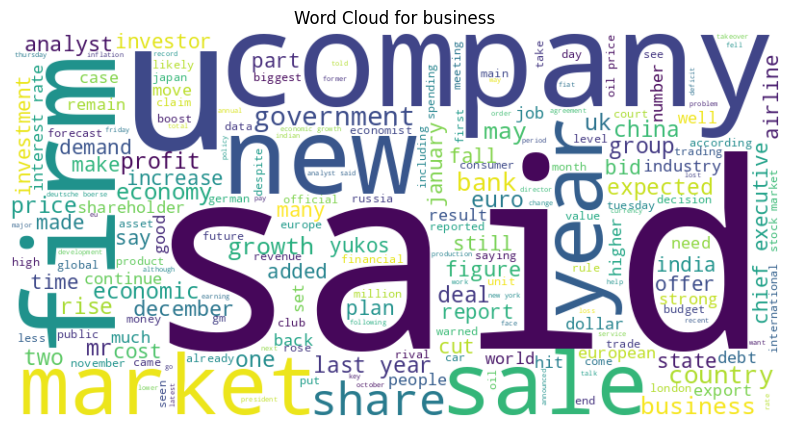

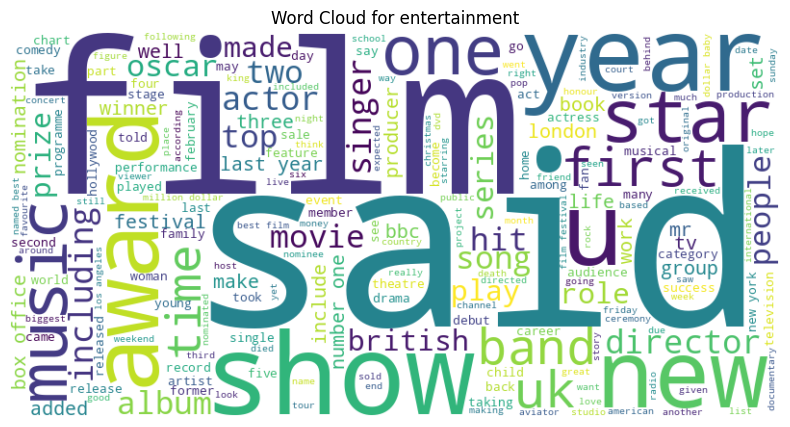

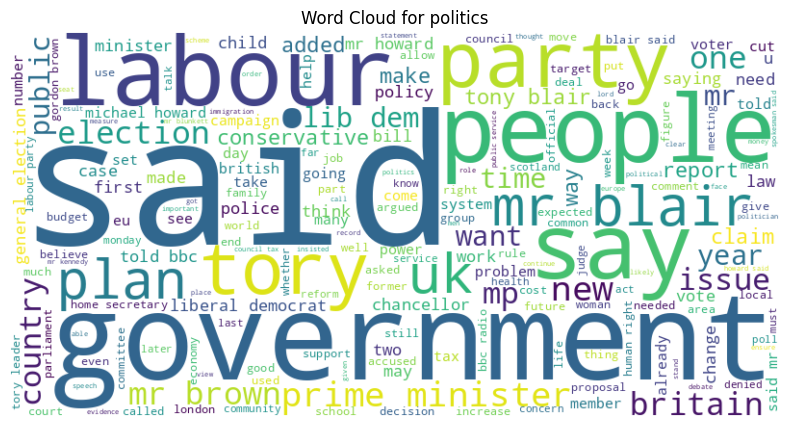

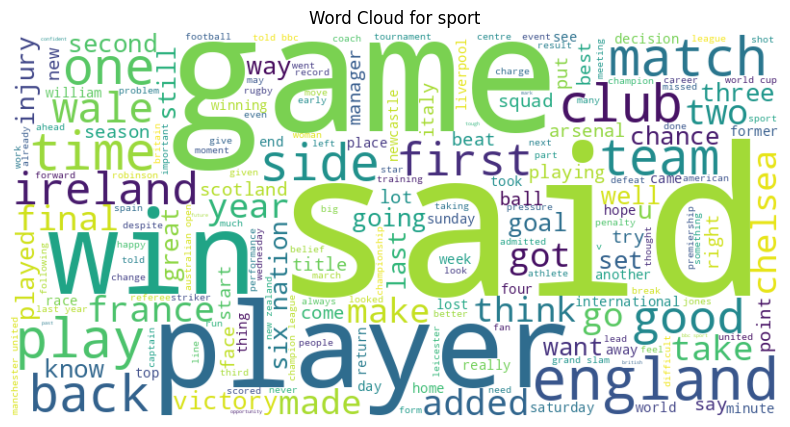

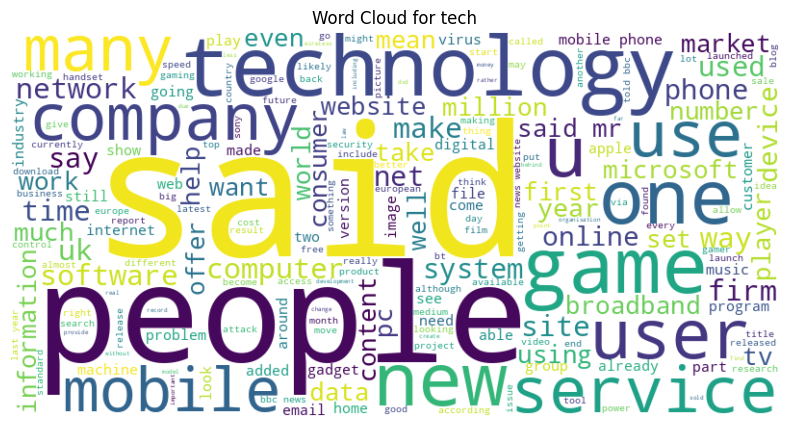

In [ ]:
# cleaned_df visualization of word cloud and barplot top n words

from wordcloud import WordCloud
import matplotlib.pyplot as plt

# Combine all cleaned texts for each category
texts_by_category = cleaned_df.groupby('category')['cleaned_text'].apply(lambda x: ' '.join(x)).reset_index()

# Create a word cloud for each category
for _, row in texts_by_category.iterrows():
    category = row['category']
    text = row['cleaned_text']

    wordcloud = WordCloud(width=800, height=400, background_color='white').generate(text)

    plt.figure(figsize=(10, 5))
    plt.imshow(wordcloud, interpolation='bilinear')
    plt.axis('off')
    plt.title(f'Word Cloud for {category}')
    plt.show()


from collections import Counter

# Function to get the top N words for a given text
def get_top_n_words(text, n=10):
    words = text.split()
    word_counts = Counter(words)
    return word_counts.most_common(n)


# Calculate top N words for each category
top_words_by_category = []
for _, row in texts_by_category.iterrows():
    category = row['category']
    text = row['cleaned_text']
    top_words = get_top_n_words(text, n=15)  # Get top 15 words
    for word, count in top_words:
        top_words_by_category.append({'category': category, 'word': word, 'count': count})


# Create a DataFrame from the top words data
top_words_df = pd.DataFrame(top_words_by_category)

# Create the bar plot
fig_bar = px.bar(top_words_df, x='word', y='count', color='category', barmode='group',
                  title='Top 15 Words by Category',
                  labels={'count': 'Word Frequency'})
fig_bar.show()

In [ ]:
vocab_size = 1000

In [ ]:
# perform tf-idf on cleaned df
# vocab_size = 400
from sklearn.feature_extraction.text import TfidfVectorizer

# Assuming 'cleaned_df' is your DataFrame with a 'cleaned_text' column.

# Create a TfidfVectorizer object
# vectorizer = TfidfVectorizer()
vectorizer = TfidfVectorizer(max_df = 0.975, min_df = 0.025, stop_words='english', smooth_idf=False, ngram_range=(1,3), max_features=vocab_size)
# Fit and transform the cleaned text data
tfidf_matrix = vectorizer.fit_transform(cleaned_df['cleaned_text'])

# Get feature names (words)
feature_names = vectorizer.get_feature_names_out()

# Print the TF-IDF matrix (optional, for inspection)
print(tfidf_matrix.toarray())

[[0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 ...
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]]


In [ ]:
tfidf_matrix.shape

(2140, 1000)

In [ ]:
import numpy as np
from sklearn.feature_extraction.text import TfidfVectorizer
from gensim.models import Word2Vec
# vocab_size = 1000
# Method 1:  Word2Vec Embeddings (contextualized)
sentences = [text.split() for text in cleaned_df['cleaned_text']]
w2v_model = Word2Vec(sentences, vector_size=vocab_size, window=5, min_count=1, workers=4)  # Adjust parameters

def document_vector(doc):
  doc_vec = np.zeros(vocab_size)  # Size of the word vectors
  word_count = 0
  for word in doc.split():
    try:
      vec = w2v_model.wv[word]
      doc_vec += vec
      word_count += 1
    except KeyError:
      pass  # Ignore out-of-vocabulary words
  if word_count > 0:
      doc_vec /= word_count
  return doc_vec

w2v_matrix = np.array([document_vector(doc) for doc in cleaned_df['cleaned_text']])

In [ ]:
w2v_matrix.shape

(2140, 1000)

In [ ]:
from gensim.models.doc2vec import Doc2Vec, TaggedDocument
# vocab_size = 50
documents = [TaggedDocument(doc.split(), [i]) for i, doc in enumerate(cleaned_df['cleaned_text'])]
doc2vec_model = Doc2Vec(documents, vector_size=vocab_size, window=5, min_count=1, workers=4, epochs=20)

d2v_matrix = np.array([doc2vec_model.infer_vector(doc.split()) for doc in cleaned_df['cleaned_text']])

In [ ]:
d2v_matrix.shape

(2140, 1000)

In [ ]:

import matplotlib.pyplot as plt
from sklearn.decomposition import PCA

def plot_cumulative_variance(matrix, threshold=0.90):
  pca = PCA()
  pca.fit(matrix)
  cumulative_variance = np.cumsum(pca.explained_variance_ratio_)
  # Find the index where the cumulative variance exceeds the threshold
  optimal_components = np.argmax(cumulative_variance >= threshold) + 1
  plt.plot(range(1, len(cumulative_variance) + 1), cumulative_variance)
  plt.xlabel('Number of Components')
  plt.ylabel('Cumulative Explained Variance')
  plt.title('Cumulative Explained Variance Plot')
  plt.axhline(y=threshold, color='r', linestyle='--', label=f'Threshold ({threshold})')
  plt.axvline(x=optimal_components, color='g', linestyle='--', label=f'Optimal Components ({optimal_components})')
  plt.legend()
  plt.grid(True)
  plt.show()

# Example usage (replace with your actual matrices)
plot_cumulative_variance(tfidf_matrix)
plot_cumulative_variance(w2v_matrix)
plot_cumulative_variance(d2v_matrix)

In [ ]:
# principal components  for each vector is the optimal component, then fit again, then pca.transform store scores_pca

def perform_pca_and_store_scores(matrix, threshold=0.90):
    """
    Performs PCA on the given matrix, determines the optimal number of components,
    performs PCA again with the optimal components, and returns the transformed scores.
    """
    pca = PCA()
    pca.fit(matrix)
    cumulative_variance = np.cumsum(pca.explained_variance_ratio_)
    optimal_components = np.argmax(cumulative_variance >= threshold) + 1
    print(f"Optimal number of features: {optimal_components}")
    pca_optimal = PCA(n_components=optimal_components)
    pca_optimal.fit(matrix)
    scores_pca = pca_optimal.transform(matrix)
    return scores_pca


# Example usage with the three matrices
scores_pca_tfidf = perform_pca_and_store_scores(tfidf_matrix)
scores_pca_w2v = perform_pca_and_store_scores(w2v_matrix)
scores_pca_d2v = perform_pca_and_store_scores(d2v_matrix)

print("PCA Scores for TF-IDF matrix shape:", scores_pca_tfidf.shape)
print("PCA Scores for Word2Vec matrix shape:", scores_pca_w2v.shape)
print("PCA Scores for Doc2Vec matrix shape:", scores_pca_d2v.shape)

We’ll incorporate the newly obtained PCA scores in the K-means algorithm. That's how we can perform segmentation based on principal components scores instead of the original features

In [ ]:
tfidf_matrix = scores_pca_tfidf
w2v_matrix = scores_pca_w2v
d2v_matrix = scores_pca_d2v

In [ ]:
import numpy as np
import plotly.graph_objects as go
from sklearn.cluster import KMeans

matrices = {
    "TF-IDF": scores_pca_tfidf,
    "Word2Vec": scores_pca_w2v,
    "Doc2Vec": scores_pca_d2v
}

for matrix_name, matrix in matrices.items():
  wcss = []
  for i in range(1, 11):
    kmeans = KMeans(n_clusters=i, init='k-means++', max_iter=300, n_init=10, random_state=0)
    kmeans.fit(matrix)
    wcss.append(kmeans.inertia_)
  fig = go.Figure(data=go.Scatter(x=list(range(1, 11)), y=wcss, mode='lines+markers'))
  fig.update_layout(title=f'Elbow Method for {matrix_name}',
                    xaxis_title='Number of clusters',
                    yaxis_title='WCSS')
  fig.show()
  slop = np.diff(wcss)
  list_k=list(range(2,11))
  print(f'Observed number of clusters for News data: {list_k[np.argmax(slop[:-1]/slop[1:])] + 1}')

Elbow method

In [ ]:
# import plotly.graph_objects as go
# from sklearn.cluster import KMeans
# # Assuming tfidf_matrix, w2v_matrix, and d2v_matrix are already defined

# matrices = {
#     "TF-IDF": tfidf_matrix,
#     "Word2Vec": w2v_matrix,
#     "Doc2Vec": d2v_matrix
# }

# for matrix_name, matrix in matrices.items():
#   wcss = []
#   for i in range(1, 11):
#     kmeans = KMeans(n_clusters=i, init='k-means++', max_iter=300, n_init=10, random_state=0)
#     kmeans.fit(matrix)
#     wcss.append(kmeans.inertia_)

#   fig = go.Figure(data=go.Scatter(x=list(range(1, 11)), y=wcss, mode='lines+markers'))
#   fig.update_layout(title=f'Elbow Method for {matrix_name}',
#                     xaxis_title='Number of clusters',
#                     yaxis_title='WCSS')
#   fig.show()
#   slop = np.diff(wcss)
#   list_k=list(range(2,11))
#   print(f'Observed number of clusters for News data: {list_k[np.argmax(slop[:-1]/slop[1:])] + 1}')


In [ ]:
import pandas as pd
import numpy as np
from sklearn.cluster import KMeans

# Assuming 'tfidf_matrix', 'w2v_matrix', and 'd2v_matrix' are already calculated as in your provided code

# Function to perform k-means clustering and return cluster labels
def perform_kmeans(matrix, n_clusters=5):
  # kmeans = KMeans(n_clusters=n_clusters, init='k-means++', random_state=42)
  kmeans = KMeans(n_clusters=n_clusters, random_state=42, n_init=100) # Increased n_init for better results
  kmeans.fit(matrix)
  return kmeans.labels_

# Perform k-means clustering for each word representation
tfidf_clusters = perform_kmeans(tfidf_matrix)
w2v_clusters = perform_kmeans(w2v_matrix)
d2v_clusters = perform_kmeans(d2v_matrix)

# Add cluster labels to the cleaned_df DataFrame
cleaned_df['tfidf_cluster'] = tfidf_clusters
cleaned_df['w2v_cluster'] = w2v_clusters
cleaned_df['d2v_cluster'] = d2v_clusters

# Print or further process the updated DataFrame
cleaned_df.columns

In [ ]:
from sklearn.metrics import silhouette_score

# Calculate Silhouette Score for TF-IDF clusters
tfidf_silhouette = silhouette_score(tfidf_matrix, tfidf_clusters)
print(f"Silhouette Score (TF-IDF): {tfidf_silhouette}")

# Calculate Silhouette Score for Word2Vec clusters
w2v_silhouette = silhouette_score(w2v_matrix, w2v_clusters)
print(f"Silhouette Score (Word2Vec): {w2v_silhouette}")

# Calculate Silhouette Score for Doc2Vec clusters
d2v_silhouette = silhouette_score(d2v_matrix, d2v_clusters)
print(f"Silhouette Score (Doc2Vec): {d2v_silhouette}")

the score of the K-means with word2vec is higher than others

In [ ]:
import plotly.express as px

# Assuming cleaned_df is already created with cluster labels (tfidf_cluster, w2v_cluster, d2v_cluster)

def plot_cluster_category_distribution(df, cluster_column):
    cluster_category_counts = df.groupby(cluster_column)['category'].value_counts().reset_index(name='count')
    fig = px.bar(cluster_category_counts,
                 x=cluster_column,
                 y='count',
                 color='category',
                 title=f'Distribution of Categories across Clusters ({cluster_column})',
                 barmode='group')
    fig.show()


# Example usage:
plot_cluster_category_distribution(cleaned_df, 'tfidf_cluster')
plot_cluster_category_distribution(cleaned_df, 'w2v_cluster')
plot_cluster_category_distribution(cleaned_df, 'd2v_cluster')

In [ ]:
# top n terms for each

# Assuming 'cleaned_df' is already created and contains 'cleaned_text' column

def get_top_n_words_per_cluster(df, cluster_column, n=10):
    """
    Gets the top N words for each cluster based on word frequencies.
    """
    top_words_data = []
    for cluster in df[cluster_column].unique():
        cluster_texts = df[df[cluster_column] == cluster]['cleaned_text']
        combined_text = ' '.join(cluster_texts)
        word_counts = Counter(combined_text.split())
        top_words = word_counts.most_common(n)
        for word, count in top_words:
            top_words_data.append({'cluster': cluster, 'word': word, 'count': count})
    return top_words_data

# Get top words for TF-IDF clusters
top_words_tfidf = get_top_n_words_per_cluster(cleaned_df, 'tfidf_cluster')

# Convert to DataFrame for plotting
top_words_tfidf_df = pd.DataFrame(top_words_tfidf)

# Plot the results
fig_tfidf = px.bar(top_words_tfidf_df, x="word", y="count", color="cluster", barmode='group',
                   title="Top 10 Words by TF-IDF Cluster",
                   labels={"count": "Word Frequency"})
fig_tfidf.show()

#Repeat for w2v and d2v clusters
top_words_w2v = get_top_n_words_per_cluster(cleaned_df, 'w2v_cluster')
top_words_w2v_df = pd.DataFrame(top_words_w2v)
fig_w2v = px.bar(top_words_w2v_df, x="word", y="count", color="cluster", barmode='group',
                   title="Top 10 Words by Word2Vec Cluster",
                   labels={"count": "Word Frequency"})
fig_w2v.show()

top_words_d2v = get_top_n_words_per_cluster(cleaned_df, 'd2v_cluster')
top_words_d2v_df = pd.DataFrame(top_words_d2v)
fig_d2v = px.bar(top_words_d2v_df, x="word", y="count", color="cluster", barmode='group',
                   title="Top 10 Words by Doc2Vec Cluster",
                   labels={"count": "Word Frequency"})
fig_d2v.show()

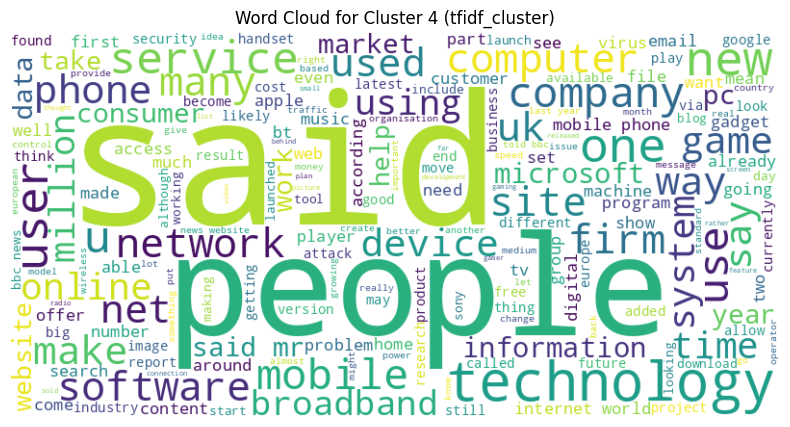

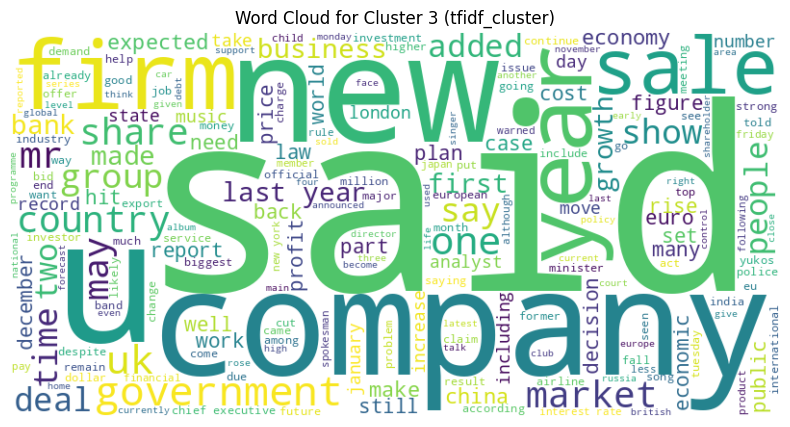

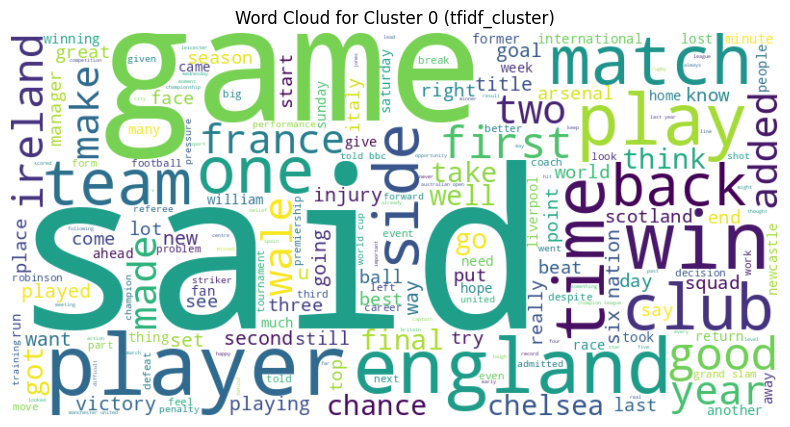

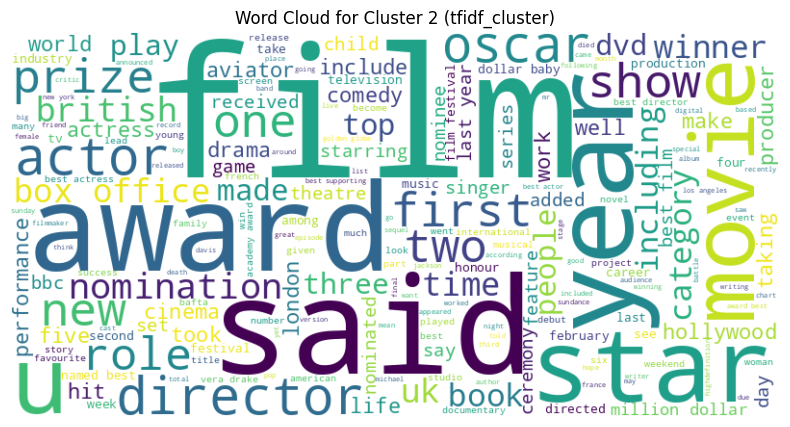

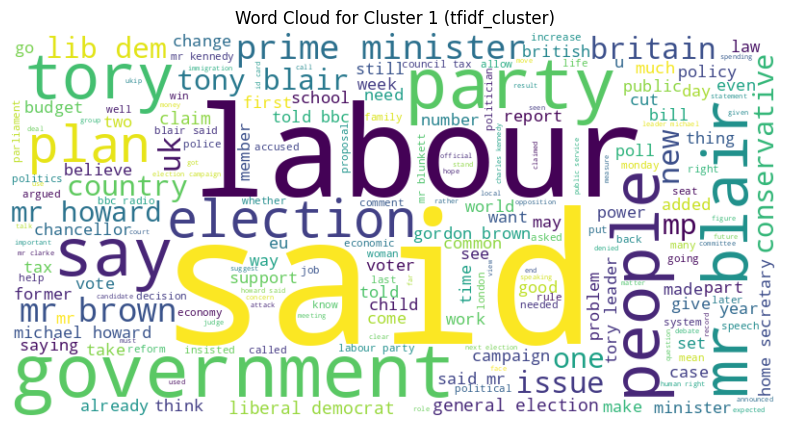

...

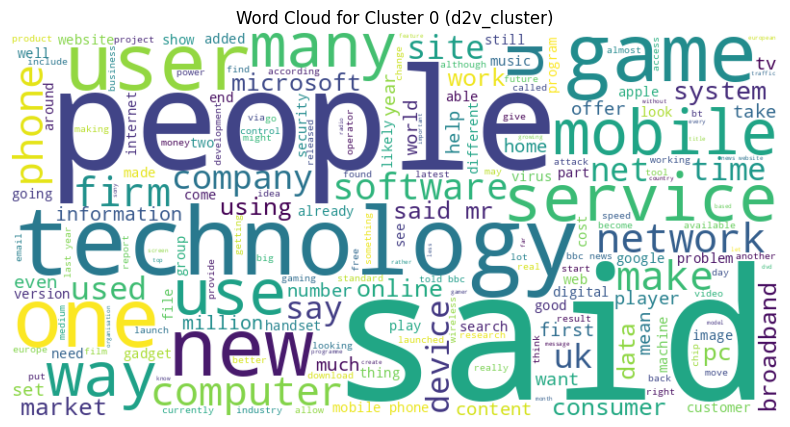

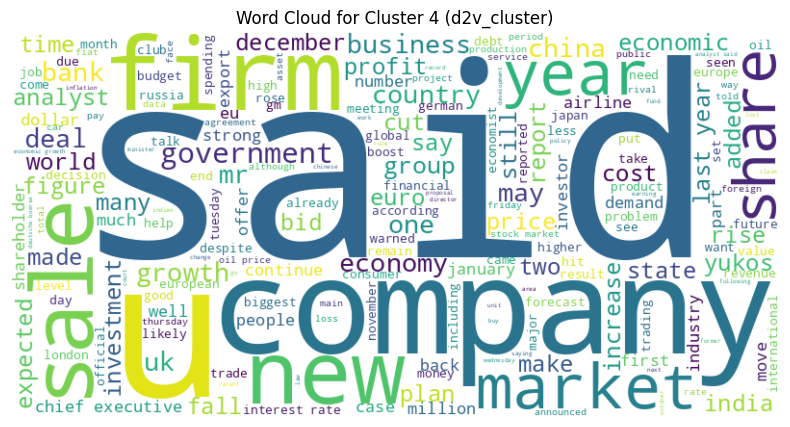

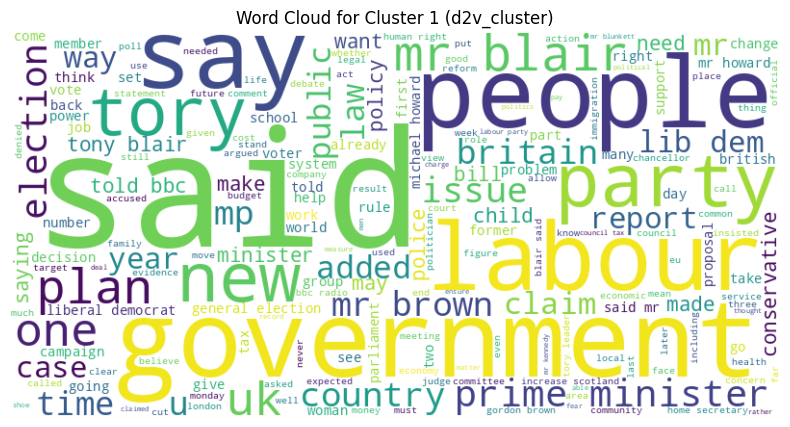

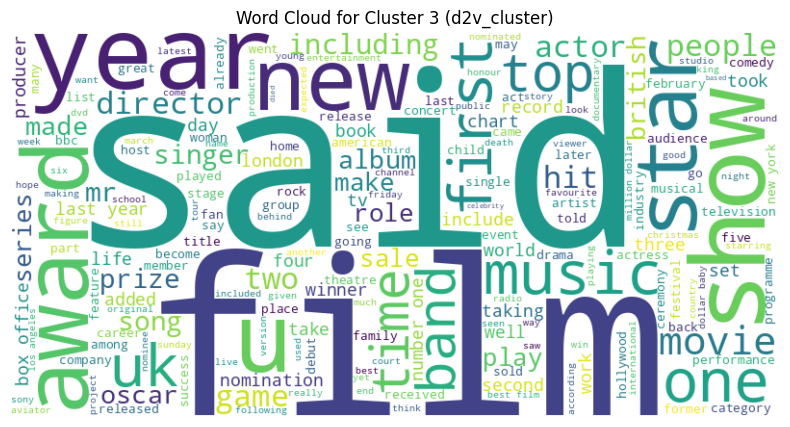

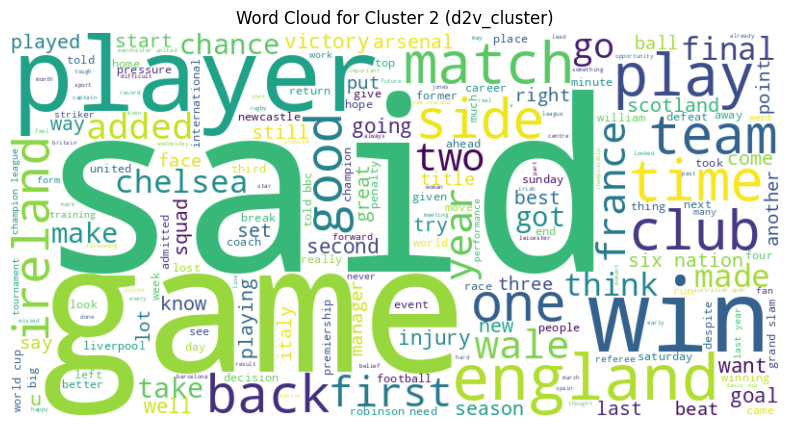

In [ ]:
# word cloud for each cluster and each matrix

# Assuming 'cleaned_df' is already created and contains cluster labels and cleaned text
#  and necessary libraries are imported

def plot_wordcloud_per_cluster(df, cluster_column):
    for cluster in df[cluster_column].unique():
        cluster_texts = df[df[cluster_column] == cluster]['cleaned_text']
        combined_text = ' '.join(cluster_texts)

        wordcloud = WordCloud(width=800, height=400, background_color='white').generate(combined_text)

        plt.figure(figsize=(10, 5))
        plt.imshow(wordcloud, interpolation='bilinear')
        plt.axis('off')
        plt.title(f'Word Cloud for Cluster {cluster} ({cluster_column})')
        plt.show()

# Example usage:
plot_wordcloud_per_cluster(cleaned_df, 'tfidf_cluster')
plot_wordcloud_per_cluster(cleaned_df, 'w2v_cluster')
plot_wordcloud_per_cluster(cleaned_df, 'd2v_cluster')

In [ ]:
import pandas as pd
import plotly.express as px
from sklearn.decomposition import PCA
import numpy as np

def plot_pca(matrix, labels, title):
    pca = PCA(n_components=2)
    pca_result = pca.fit_transform(matrix if isinstance(matrix, (pd.DataFrame, type(np.array([])))) else matrix)

    df_pca = pd.DataFrame(data=pca_result, columns=['PC1', 'PC2'])
    df_pca['Cluster'] = labels
    df_pca['Category'] = cleaned_df['category']

    fig = px.scatter(df_pca, x='PC1', y='PC2', color='Cluster', symbol='Category', hover_data=['Category'], title=title)

    # Update layout to prevent overlapping
    fig.update_layout(legend=dict(
        orientation="h",  # Horizontal legend
        yanchor="bottom",
        y=1.02,  # Adjust vertical position
        xanchor="right",
        x=1
    ))

    fig.show()

# Plot PCA for TF-IDF
plot_pca(tfidf_matrix, cleaned_df['tfidf_cluster'], 'PCA of TF-IDF Matrix')

# Plot PCA for Word2Vec
plot_pca(w2v_matrix, cleaned_df['w2v_cluster'], 'PCA of Word2Vec Matrix')

# Plot PCA for Doc2Vec
plot_pca(d2v_matrix, cleaned_df['d2v_cluster'], 'PCA of Doc2Vec Matrix')

In [ ]:
import plotly.express as px
from sklearn.decomposition import PCA
import pandas as pd
import numpy as np

def plot_pca_3d(matrix, labels, title):
    pca = PCA(n_components=3)
    pca_result = pca.fit_transform(matrix)

    df_pca = pd.DataFrame(data=pca_result, columns=['PC1', 'PC2', 'PC3'])
    df_pca['Cluster'] = labels
    df_pca['Category'] = cleaned_df['category']

    fig = px.scatter_3d(df_pca, x='PC1', y='PC2', z='PC3', color='Cluster', symbol='Category',
                       hover_data=['Category'], title=title, width=800, height=600)

    # Update marker size using update_traces
    fig.update_traces(marker=dict(size=2))  # Adjust the size value as needed

    fig.update_layout(legend=dict(
        orientation="h",
        yanchor="bottom",
        y=1.02,
        xanchor="right",
        x=1
    ))
    fig.show()

# Plot PCA for TF-IDF
plot_pca_3d(tfidf_matrix, cleaned_df['tfidf_cluster'], '3D PCA of TF-IDF Matrix')

# Plot PCA for Word2Vec
plot_pca_3d(w2v_matrix, cleaned_df['w2v_cluster'], '3D PCA of Word2Vec Matrix')

# Plot PCA for Doc2Vec
plot_pca_3d(d2v_matrix, cleaned_df['d2v_cluster'], '3D PCA of Doc2Vec Matrix')

Hierachy cluster

Unlike Kmeans algrithm, Hierarchical clustering or hcluster does not require a prior number of clusters. It iteratively merges (agglomerative or bottom up approach) into less and less clusters starting from each points being a cluster on its own, or separate the data point (divisive or top-down approach) to create more and more clusters starting from one clsuter containing all data points.

In [ ]:
from sklearn.cluster import AgglomerativeClustering
from scipy.cluster.hierarchy import dendrogram, linkage
import matplotlib.pyplot as plt
import seaborn as sns


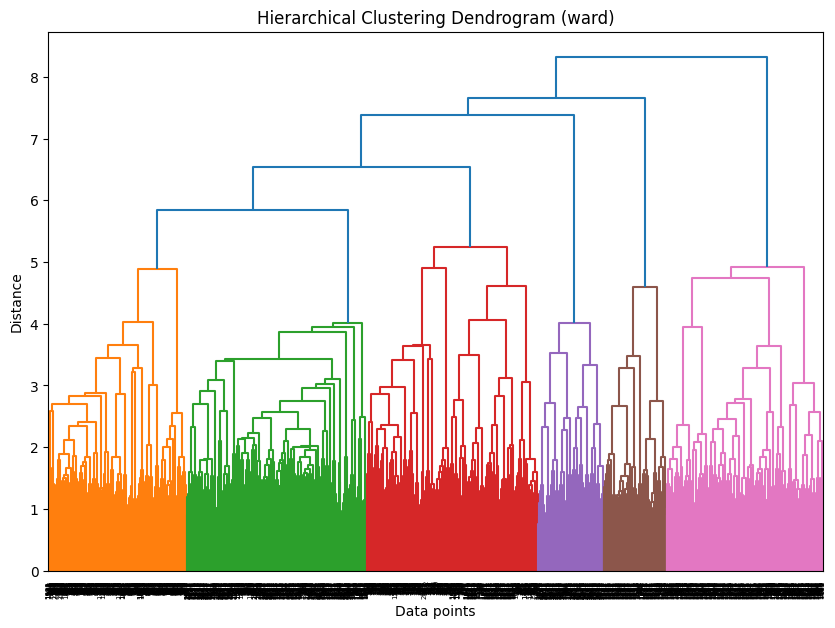

In [ ]:
def perform_hierarchical_clustering(matrix, method='ward'):
    linked = linkage(matrix, method)
    plt.figure(figsize=(10, 7))
    dendrogram(linked,
               orientation='top',
               distance_sort='descending',
               show_leaf_counts=True)
    plt.title(f'Hierarchical Clustering Dendrogram ({method})')
    plt.xlabel('Data points')
    plt.ylabel('Distance')
    plt.show()

perform_hierarchical_clustering(tfidf_matrix, method='ward')

In [ ]:
# Function to perform Agglomerative Clustering
def perform_agglomerative(matrix, n_clusters):
    agg_clustering = AgglomerativeClustering(n_clusters=n_clusters, linkage='ward')
    agg_labels = agg_clustering.fit_predict(matrix)
    return agg_labels


# Perform agglomerative clustering for each matrix
n_clusters = 5  # Example number of clusters, adjust as needed
agg_tfidf_labels = perform_agglomerative(tfidf_matrix, n_clusters)
agg_w2v_labels = perform_agglomerative(w2v_matrix, n_clusters)
agg_d2v_labels = perform_agglomerative(d2v_matrix, n_clusters)

In [ ]:
# Add agglomerative cluster labels to the dataframe
cleaned_df['agg_tfidf_cluster'] = agg_tfidf_labels
cleaned_df['agg_w2v_cluster'] = agg_w2v_labels
cleaned_df['agg_d2v_cluster'] = agg_d2v_labels


# Calculate Silhouette Score
tfidf_silhouette_agg = silhouette_score(tfidf_matrix, agg_tfidf_labels)
print(f"Silhouette Score (Agglomerative TF-IDF): {tfidf_silhouette_agg}")

w2v_silhouette_agg = silhouette_score(w2v_matrix, agg_w2v_labels)
print(f"Silhouette Score (Agglomerative Word2Vec): {w2v_silhouette_agg}")

d2v_silhouette_agg = silhouette_score(d2v_matrix, agg_d2v_labels)
print(f"Silhouette Score (Agglomerative Doc2Vec): {d2v_silhouette_agg}")



Silhouette Score (Agglomerative TF-IDF): 0.027196218599011612
Silhouette Score (Agglomerative Word2Vec): 0.22999534262144672
Silhouette Score (Agglomerative Doc2Vec): 0.05580019950866699


In [ ]:
# Visualizations and analysis as before for Kmeans and other representations
plot_pca(tfidf_matrix, cleaned_df["agg_tfidf_cluster"], "Agglomerative TF-IDF Clustering PCA")
plot_pca(w2v_matrix, cleaned_df["agg_w2v_cluster"], "Agglomerative Word2Vec Clustering PCA")
plot_pca(d2v_matrix, cleaned_df["agg_d2v_cluster"], "Agglomerative Doc2Vec Clustering PCA")

plot_cluster_category_distribution(cleaned_df, 'agg_tfidf_cluster')
plot_cluster_category_distribution(cleaned_df, 'agg_w2v_cluster')
plot_cluster_category_distribution(cleaned_df, 'agg_d2v_cluster')

In [ ]:
def get_top_n_words_per_cluster(df, cluster_column, n=10):
    """
    Gets the top N words for each cluster based on word frequencies.
    """
    top_words_data = []
    for cluster in df[cluster_column].unique():
        cluster_texts = df[df[cluster_column] == cluster]['cleaned_text']
        combined_text = ' '.join(cluster_texts)
        word_counts = Counter(combined_text.split())
        top_words = word_counts.most_common(n)
        for word, count in top_words:
            top_words_data.append({'cluster': cluster, 'word': word, 'count': count})
    return top_words_data

# Assuming cleaned_df has columns: 'agg_tfidf_cluster', 'agg_w2v_cluster', 'agg_d2v_cluster'
cluster_columns = ['agg_tfidf_cluster', 'agg_w2v_cluster', 'agg_d2v_cluster']
for col in cluster_columns:
    # Get top words for each cluster type
    top_words = get_top_n_words_per_cluster(cleaned_df, col)
    top_words_df = pd.DataFrame(top_words)

    # Plot the results
    fig = px.bar(top_words_df, x="word", y="count", color="cluster", barmode='group',
                   title=f"Top 10 Words by {col.replace('agg_', '').replace('_cluster', '')} Cluster",
                   labels={"count": "Word Frequency"})
    fig.show()

In [ ]:
# word cloud for each hierarchical cluster and each matrix

def plot_wordcloud_per_cluster(df, cluster_column):
    for cluster in df[cluster_column].unique():
        cluster_texts = df[df[cluster_column] == cluster]['cleaned_text']
        combined_text = ' '.join(cluster_texts)

        wordcloud = WordCloud(width=800, height=400, background_color='white').generate(combined_text)

        plt.figure(figsize=(10, 5))
        plt.imshow(wordcloud, interpolation='bilinear')
        plt.axis('off')
        plt.title(f'Word Cloud for Cluster {cluster} ({cluster_column})')
        plt.show()

# Example usage for agglomerative clustering results:
plot_wordcloud_per_cluster(cleaned_df, 'agg_tfidf_cluster')
plot_wordcloud_per_cluster(cleaned_df, 'agg_w2v_cluster')
plot_wordcloud_per_cluster(cleaned_df, 'agg_d2v_cluster')